# Compare Vendor Specs (examples)


Paul Montesano, PhD  
December 2025

In [1]:
# Load required libraries
library(tidyverse)
library(patchwork)
library(scales)
library(ggrepel)
#library(viridis)

library(googlesheets4)

Warning message:
“package ‘tidyverse’ was built under R version 4.4.3”
Warning message:
“package ‘ggplot2’ was built under R version 4.4.3”
Warning message:
“package ‘tibble’ was built under R version 4.4.3”
Warning message:
“package ‘tidyr’ was built under R version 4.4.3”
Warning message:
“package ‘readr’ was built under R version 4.4.3”
Warning message:
“package ‘purrr’ was built under R version 4.4.3”
Warning message:
“package ‘dplyr’ was built under R version 4.4.3”
Warning message:
“package ‘stringr’ was built under R version 4.4.3”
Warning message:
“package ‘forcats’ was built under R version 4.4.3”
Warning message:
“package ‘lubridate’ was built under R version 4.4.3”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.2.1     ✔ readr     2.2.0
✔ forcats   1.0.1     ✔ stringr   1.6.0
✔ ggplot2   4.0.2     ✔ tibble    3.3.1
✔ lubridate 1.9.5     ✔ tidyr     1.3.2
✔ purrr     1.2.2     
── Conflicts ──────────────────────────────────────

In [2]:
# Authenticate
gs4_deauth()

In [3]:
sheet_id = '13MrpqFtAOqQY9WdW9lHNsqjCbG-e3VQkEDbHOGIKa6k'
df = read_sheet(sheet_id, sheet = 'Vendor Specs', skip = 0) %>% 
    as.data.frame() %>%
    mutate(Constellation = ifelse(is.na(`Constellation/Platform`), ' ', `Constellation/Platform`)) %>%
    mutate(`Branded Name` = ifelse(is.na(`Branded Name`), ' ', `Branded Name`)) 

✔ Reading from CSDA Prototype Vendor Specifications & Evaluation DB.

✔ Range ''Vendor Specs''.



In [4]:
# Define color palettes
sector_colors <- c("Commercial" = "#E69F00", "Government" = "#56B4E9")
affiliation_colors <- c(
  "Airbus" = "#E69F00",
  "Satellogic" = "#F0E442",
  "ESA" = "#0072B2",
  "USGS/NASA" = "#009E73",
  "NASA" = "#009E73",
  "NOAA" = "#56B4E9",
  "NOAA/NASA" = "#56B4E9",
  "JAXA" = "#CC79A7"
)

# Prepare data
df_clean <- df %>%
  mutate(
    `Launch Date` = as.Date(`Launch Date`),
    Year = year(`Launch Date`),
    `Mission Status` = case_when(
      `Mission Status` %in% c("Operational", "Constellation") ~ "Operational",
      `Mission Status` == "Planned" ~ "Planned",
      `Mission Status` == "Failed" ~ "Failed",
      TRUE ~ "End of Mission"
    ),
    # Create size categories
    Weight_Category = cut(`Weight Range (kg)`,
                         breaks = c(0, 100, 500, 2000, 10000),
                         labels = c("Micro (<100kg)", "Small (100-500kg)", 
                                   "Medium (500-2000kg)", "Large (>2000kg)")),
    # Resolution category
    Resolution_Category = case_when(
      `MS GSD Nadir (m)` <= 5 ~ "Very High (<5m)",
      `MS GSD Nadir (m)` <= 30 ~ "High (5-30m)",
      `MS GSD Nadir (m)` <= 100 ~ "Medium (30-100m)",
      TRUE ~ "Low (>100m)"
    ),
    # Swath category
    Swath_Category = case_when(
      `Swath Width (km)` < 100 ~ "Narrow (<100km)",
      `Swath Width (km)` < 500 ~ "Medium (100-500km)",
      `Swath Width (km)` < 1500 ~ "Wide (500-1500km)",
      TRUE ~ "Very Wide (>1500km)"
    )
  ) %>%
  #filter(!is.na(Year), Year >= 1980, Year <= 2035) %>%
  filter(Sector %in% c("Commercial", "Government"))

# PLOT 1: Timeline of Launches with Size and Resolution
p1 <- ggplot(df_clean %>% filter(`Mission Status` != "Failed"), 
             aes(x = `Launch Date`, y = `MS GSD Nadir (m)`, 
                 color = Sector, size = `Weight Range (kg)`)) +
  geom_point(alpha = 0.7) +
  geom_text_repel(
    data = df_clean %>% 
      filter(`Mission Status` != "Failed", 
             Year >= 2020 | `Branded Name` %in% c("Landsat 7", "Landsat 8", "Sentinel-2A")),
    aes(label = `Branded Name`),
    size = 2.5,
    max.overlaps = 15,
    segment.size = 0.2
  ) +
  scale_y_log10(breaks = c(1, 3, 10, 30, 100, 300, 1000),
                labels = c("1m", "3m", "10m", "30m", "100m", "300m", "1000m")) +
  scale_size_continuous(range = c(2, 12), name = "Satellite Mass (kg)") +
  scale_color_manual(values = sector_colors) +
  labs(
    title = "Evolution of Multispectral Resolution Over Time",
    subtitle = "Size represents satellite mass; Government missions trend toward larger, coarser resolution",
    x = "Launch Date",
    y = "Multispectral GSD (meters, log scale)",
    color = "Sector"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "right",
    plot.title = element_text(face = "bold", size = 14),
    panel.grid.minor = element_line(linetype = "dotted", color = "gray90")
  )

# PLOT 2: Swath Width vs Resolution Trade-off
p2 <- ggplot(df_clean %>% filter(!is.na(`Swath Width (km)`), !is.na(`MS GSD Nadir (m)`)),
             aes(x = `MS GSD Nadir (m)`, y = `Swath Width (km)`, 
                 color = Sector, shape = `Mission Status`)) +
  geom_point(size = 4, alpha = 0.7) +
  geom_text_repel(
    data = df_clean %>% 
      filter(!is.na(`Swath Width (km)`), !is.na(`MS GSD Nadir (m)`),
             (`Swath Width (km)` > 1000 | `MS GSD Nadir (m)` < 5)),
    aes(label = `Branded Name`),
    size = 2.5,
    max.overlaps = 10
  ) +
  scale_x_log10() +
  scale_y_log10() +
  scale_color_manual(values = sector_colors) +
  scale_shape_manual(values = c("Operational" = 16, "Planned" = 17, 
                                "End of Mission" = 1, "Failed" = 4)) +
  labs(
    title = "Resolution vs Coverage Trade-off",
    subtitle = "Government missions prioritize wide swaths; Commercial focuses on high resolution",
    x = "Multispectral GSD (meters, log scale)",
    y = "Swath Width (kilometers, log scale)",
    color = "Sector",
    shape = "Status"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "right",
    plot.title = element_text(face = "bold", size = 14)
  )




In [5]:
# PLOT 3: Timeline with Mission Status
status_timeline <- df_clean %>%
  mutate(End_Year = ifelse(is.na(`End Date`) & `Mission Status` == "Operational", 
                          as.numeric(format(Sys.Date(), "%Y")) + 
                            as.numeric(format(Sys.Date(), "%j"))/365.25, 
                          year(as.Date(`End Date`)))) %>%
  filter(!is.na(Year))



p3_simple <- ggplot(status_timeline, aes(y = reorder(`Sector`, Year))) +
    geom_vline(xintercept = as.numeric(format(Sys.Date(), "%Y")) + 
                              as.numeric(format(Sys.Date(), "%j"))/365.25,
                 linetype = "dashed", color = "black", size = 1) +
  geom_segment(aes(x = Year, xend = ifelse(is.na(End_Year), 2032, End_Year),
                  #yend = `Branded Name`, color = Sector),
                   yend = `Sector`, color = Sector),
              size = 10, alpha = 0.05) +
  geom_point(aes(x = Year, color = Sector), size = 3) +
  geom_point(data = status_timeline %>% filter(!is.na(End_Year), End_Year < 2025),
            aes(x = End_Year), color = "red", size = 2, shape = 4) +
  scale_color_manual(values = sector_colors) +
  scale_x_continuous(breaks = seq(1984, 2035, 5), limits = c(1984, 2035)) +
  labs(
    title = "Mission Lifespans: Commercial vs Government",
    subtitle = "Lines show operational period; X marks end of mission",
    x = "Year",
    y = NULL,
    color = "Sector"
  ) +
  theme_minimal(base_size = 20) +
  theme(
    legend.position = "bottom",
    plot.title = element_text(face = "bold", size = 25),
    #axis.text.y = element_text(size = 9),
    panel.grid.major.y = element_blank()
  )


ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[36mℹ[39m In argument: `End_Year = ifelse(...)`.
[1mCaused by error in `as.Date.default()`:[22m
[33m![39m do not know how to convert 'End Date' to class “Date”


In [ ]:
options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 300)

p3_simple

In [ ]:
p3 <- ggplot(status_timeline, aes(y = reorder(`Branded Name`, Year))) +
    geom_vline(xintercept = as.numeric(format(Sys.Date(), "%Y")) + 
                              as.numeric(format(Sys.Date(), "%j"))/365.25,
               linetype = "dashed", color = "black", size = 1) +
  geom_segment(aes(x = Year, xend = ifelse(is.na(End_Year), 2032, End_Year),
                  yend = `Branded Name`, color = Sector),
              size = 3, alpha = 0.25) +
  geom_point(aes(x = Year, color = Sector), size = 3) +
  geom_point(data = status_timeline %>% filter(!is.na(End_Year), End_Year < 2025),
            aes(x = End_Year), color = "red", size = 2, shape = 4) +
  scale_color_manual(values = sector_colors) +
  scale_x_continuous(breaks = seq(1984, 2035, 5), limits = c(1984, 2035)) +
  labs(
    title = "Mission Lifespans: Commercial vs Government",
    subtitle = "Lines show operational period; X marks end of mission",
    x = "Year",
    y = NULL,
    color = "Sector"
  ) +
  theme_minimal(base_size = 9) +
  theme(
    legend.position = "bottom",
    plot.title = element_text(face = "bold", size = 14),
    axis.text.y = element_text(size = 9),
    panel.grid.major.y = element_blank()
  )

In [ ]:
search_strings <- c("Landsat", "Sentinel")
pattern <- paste(search_strings, collapse = "|")
(status_timeline %>% filter(grepl(pattern, `Constellation/Platform`, ignore.case = TRUE)))

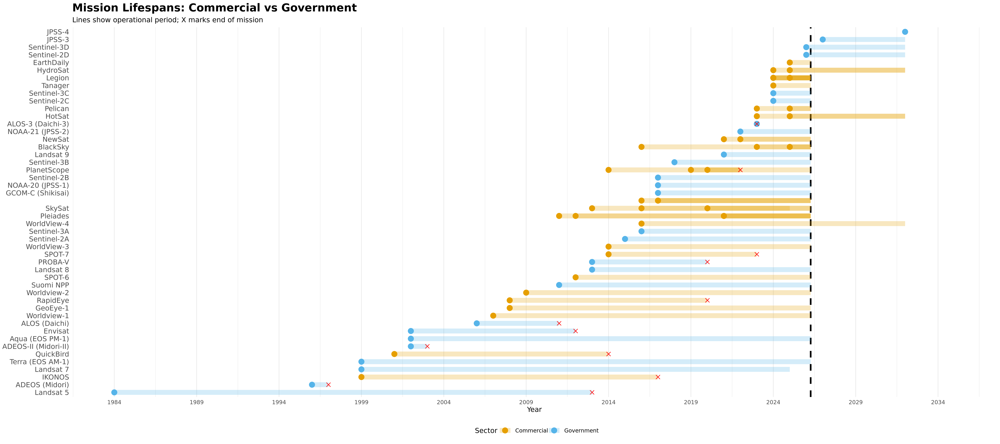

In [10]:
options(repr.plot.width = 18, repr.plot.height = 8, repr.plot.res = 300)

p3

In [11]:
# PLOT 4: Satellite Mass Distribution Over Time
p4 <- ggplot(df_clean %>% filter(!is.na(`Weight Range (kg)`), `Mission Status` != "Failed"),
             aes(x = Year, y = `Weight Range (kg)`, color = Sector, group = Sector)) +
  geom_point(alpha = 0.5, size = 3) +
  geom_smooth(method = "loess", se = TRUE, alpha = 0.2, size = 1.5) +
  scale_color_manual(values = sector_colors) +
  scale_y_log10(labels = comma) +
  labs(
    title = "Satellite Mass Trends",
    subtitle = "Commercial sector trending toward smaller satellites; Government maintains larger platforms",
    x = "Launch Year",
    y = "Satellite Mass (kg, log scale)",
    color = "Sector"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "right",
    plot.title = element_text(face = "bold", size = 14)
  )

# PLOT 5: Spectral Bands Count Comparison
bands_data <- df_clean %>%
  filter(!is.na(`Total Bands`), `Total Bands` > 0) %>%
  mutate(Era = case_when(
    Year < 2000 ~ "1996-1999",
    Year < 2010 ~ "2000-2009",
    Year < 2020 ~ "2010-2019",
    TRUE ~ "2020+"
  ))

p5 <- ggplot(bands_data, aes(x = Era, y = `Total Bands`, fill = Sector)) +
  geom_boxplot(alpha = 0.7, outlier.alpha = 0.5) +
  scale_fill_manual(values = sector_colors) +
  labs(
    title = "Spectral Capability Evolution",
    subtitle = "Number of spectral bands by era and sector",
    x = "Era",
    y = "Total Number of Bands",
    fill = "Sector"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "right",
    plot.title = element_text(face = "bold", size = 14)
  )

# PLOT 6: Revisit Time Comparison
p6 <- ggplot(df_clean %>% filter(!is.na(`Revisit Time (days)`), `Revisit Time (days)` < 50),
             aes(x = `Launch Date`, y = `Revisit Time (days)`, color = Sector)) +
  geom_point(size = 3, alpha = 0.7) +
  geom_smooth(method = "loess", se = TRUE, alpha = 0.2) +
  scale_color_manual(values = sector_colors) +
  scale_y_log10(breaks = c(0.5, 1, 2, 5, 10, 20, 50)) +
  labs(
    title = "Temporal Resolution Trends",
    subtitle = "Commercial constellations achieve sub-daily revisit; Government maintains moderate cadence",
    x = "Launch Date",
    y = "Revisit Time (days, log scale)",
    color = "Sector"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "right",
    plot.title = element_text(face = "bold", size = 14)
  )

Warning message:
“Removed 10 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_text_repel()`).”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“ggrepel: 17 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 47 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“Removed 10 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_text_repel()`).”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 19 unlabeled data points (too man

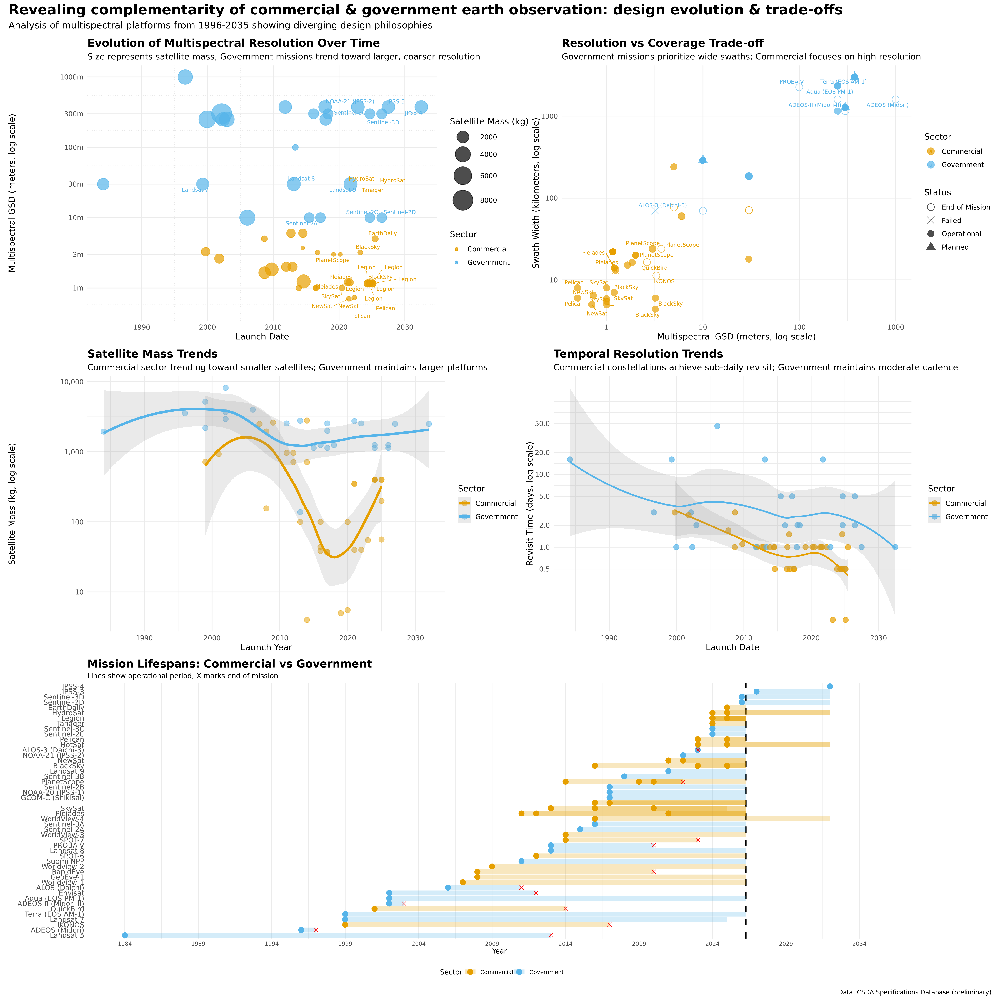

In [13]:
options(repr.plot.width = 18, repr.plot.height = 18, repr.plot.res = 300)

# COMBINE PLOTS using patchwork
final_plot <- (p1 | p2) / (p4 | p6) / (p3) +
  plot_annotation(
    title = "Revealing complementarity of commercial & government earth observation: design evolution & trade-offs",
    subtitle = "Analysis of multispectral platforms from 1996-2035 showing diverging design philosophies",
    caption = "Data: CSDA Specifications Database (preliminary)",
    theme = theme(
      plot.title = element_text(size = 18, face = "bold", hjust = 0),
      plot.subtitle = element_text(size = 12, hjust = 0),
      plot.caption = element_text(size = 8, hjust = 1)
    )
  )

# Display the plot
print(final_plot)

# Save high-resolution version
ggsave("satellite_comparison_analysis.png", final_plot, 
       width = 16, height = 20, dpi = 300, bg = "white")

Warning message:
“Removed 10 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_text_repel()`).”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“ggrepel: 17 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 47 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“Removed 10 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_text_repel()`).”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“ggrepel: 24 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


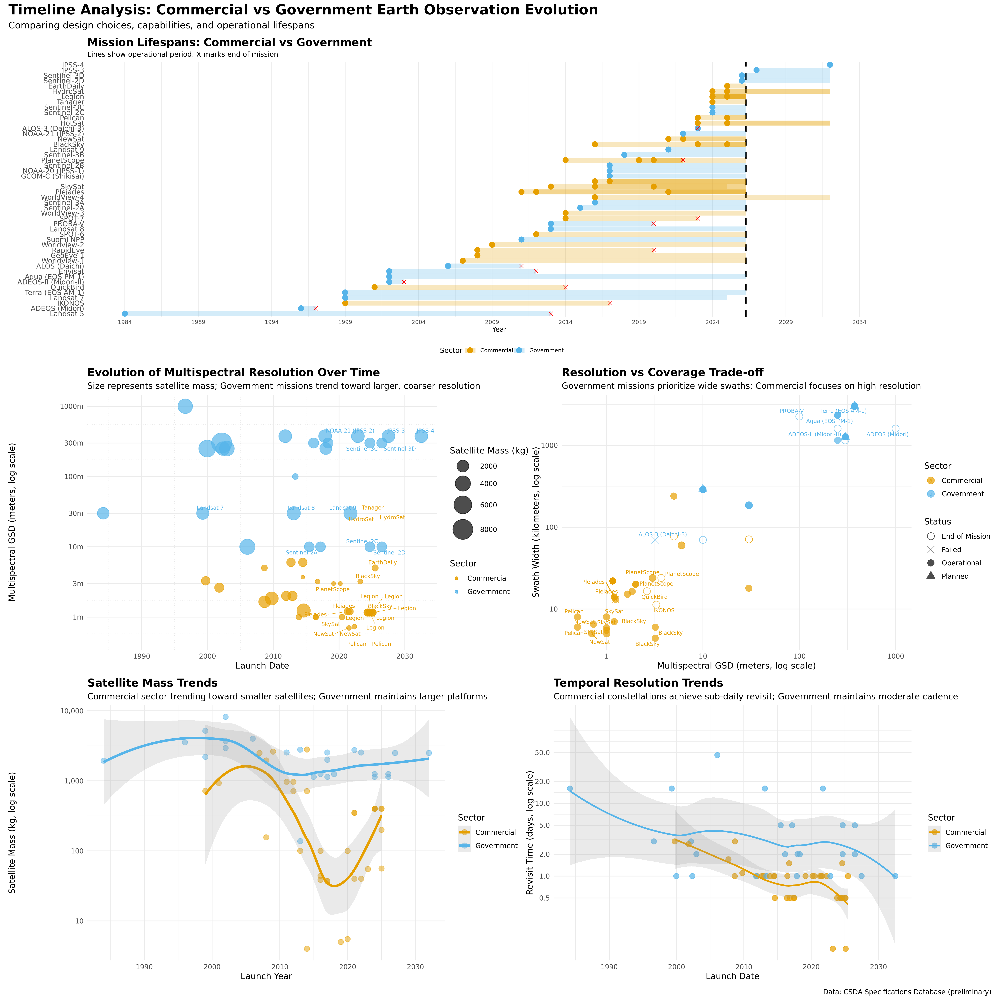

In [14]:
options(repr.plot.width = 18, repr.plot.height = 18, repr.plot.res = 300)

# Alternative layout focusing on timeline
timeline_plot <- p3 / (p1 | p2) / (p4 | p6) +
  plot_annotation(
    title = "Timeline Analysis: Commercial vs Government Earth Observation Evolution",
    subtitle = "Comparing design choices, capabilities, and operational lifespans",
    caption = "Data: CSDA Specifications Database (preliminary)",
    theme = theme(
      plot.title = element_text(size = 18, face = "bold"),
      plot.subtitle = element_text(size = 12)
    )
  )

print(timeline_plot)

ggsave("satellite_timeline_analysis.png", timeline_plot,
       width = 18, height = 16, dpi = 300, bg = "white")



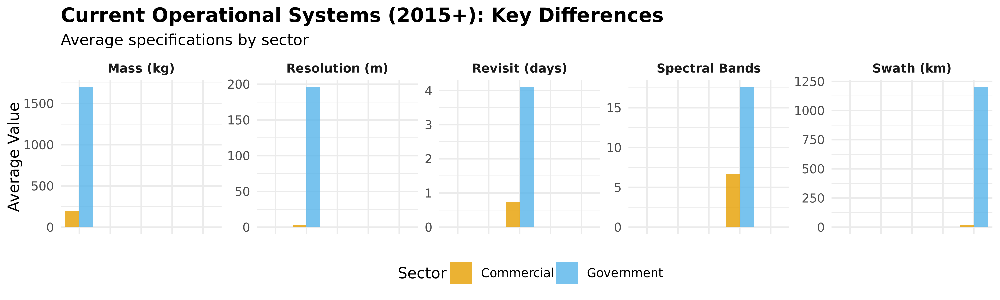

In [15]:
options(repr.plot.width = 10, repr.plot.height =3, repr.plot.res = 300)

# Create a focused "key differences" summary plot
summary_data <- df_clean %>%
  filter(`Mission Status` == "Operational", Year >= 2015) %>%
  group_by(Sector) %>%
  summarise(
    avg_resolution = mean(`MS GSD Nadir (m)`, na.rm = TRUE),
    avg_swath = mean(`Swath Width (km)`, na.rm = TRUE),
    avg_revisit = mean(`Revisit Time (days)`, na.rm = TRUE),
    avg_mass = mean(`Weight Range (kg)`, na.rm = TRUE),
    avg_bands = mean(`Total Bands`, na.rm = TRUE),
    .groups = 'drop'
  ) %>%
  pivot_longer(cols = -Sector, names_to = "Metric", values_to = "Value") %>%
  mutate(
    Metric = recode(Metric,
                   "avg_resolution" = "Resolution (m)",
                   "avg_swath" = "Swath (km)",
                   "avg_revisit" = "Revisit (days)",
                   "avg_mass" = "Mass (kg)",
                   "avg_bands" = "Spectral Bands")
  )

p_summary <- ggplot(summary_data, aes(x = Metric, y = Value, fill = Sector)) +
  geom_col(position = "dodge", alpha = 0.8) +
  facet_wrap(~Metric, scales = "free_y", ncol = 5) +
  scale_fill_manual(values = sector_colors) +
  labs(
    title = "Current Operational Systems (2015+): Key Differences",
    subtitle = "Average specifications by sector",
    x = NULL,
    y = "Average Value",
    fill = "Sector"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "bottom",
    plot.title = element_text(face = "bold", size = 14),
    strip.text = element_text(face = "bold"),
    axis.text.x = element_blank()
  )

print(p_summary)

ggsave("satellite_summary_comparison.png", p_summary,
       width = 14, height = 6, dpi = 300, bg = "white")

In [16]:
options(repr.plot.width = 10, repr.plot.height =10, repr.plot.res = 300)

# Define color palettes
era_colors <- c(
  "Commercial (Current)" = "#E69F00",
  "Government (Past)" = "#999999",
  "Government (Current)" = "#56B4E9",
  "Government (Planned)" = "#009E73"
)

# Prepare data with era classifications
df_era <- df %>%
  mutate(
    `Launch Date` = as.Date(`Launch Date`),
    Year = year(`Launch Date`),
    `Mission Status` = case_when(
      `Mission Status` %in% c("Operational", "Constellation") ~ "Operational",
      `Mission Status` == "Planned" ~ "Planned",
      `Mission Status` == "Failed" ~ "Failed",
      TRUE ~ "End of Mission"
    ),
    # Create era groups
    Era_Group = case_when(
      Sector == "Commercial" & `Mission Status` == "Operational" ~ "Commercial (Current)",
      Sector == "Government" & `Mission Status` == "End of Mission" ~ "Government (Past)",
      Sector == "Government" & `Mission Status` == "Operational" ~ "Government (Current)",
      Sector == "Government" & `Mission Status` == "Planned" ~ "Government (Planned)",
      TRUE ~ "Other"
    ),
    # Ensure proper ordering
    Era_Group = factor(Era_Group, 
                      levels = c("Government (Past)", "Government (Current)", 
                                "Government (Planned)", "Commercial (Current)"))
  ) %>%
  filter(!is.na(Year), Year >= 1996, Year <= 2035, 
         Era_Group != "Other", `Mission Status` != "Failed")

# PLOT 1: Resolution Comparison Across Eras
p1 <- ggplot(df_era %>% filter(!is.na(`MS GSD Nadir (m)`)),
             aes(x = Era_Group, y = `MS GSD Nadir (m)`, fill = Era_Group)) +
  geom_boxplot(alpha = 0.7, outlier.shape = 21, outlier.size = 3) +
  geom_jitter(width = 0.2, alpha = 0.5, size = 2) +
  scale_y_log10(breaks = c(1, 3, 10, 30, 100, 300, 1000),
                labels = c("1m", "3m", "10m", "30m", "100m", "300m", "1000m")) +
  scale_fill_manual(values = era_colors) +
  labs(
    title = "Spatial Resolution: Government Evolution vs Current Commercial",
    subtitle = "Commercial platforms achieve significantly higher resolution than government counterparts",
    x = NULL,
    y = "Multispectral GSD (meters, log scale)",
    fill = "Platform Group"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "none",
    plot.title = element_text(face = "bold", size = 13),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10),
    panel.grid.major.x = element_blank()
  ) +
  annotate("text", x = 4, y = 2, label = "Higher\nResolution", 
           size = 3, color = "gray40", fontface = "italic") +
  annotate("text", x = 1, y = 500, label = "Lower\nResolution", 
           size = 3, color = "gray40", fontface = "italic")

# PLOT 2: Swath Width Comparison
p2 <- ggplot(df_era %>% filter(!is.na(`Swath Width (km)`)),
             aes(x = Era_Group, y = `Swath Width (km)`, fill = Era_Group)) +
  geom_boxplot(alpha = 0.7, outlier.shape = 21, outlier.size = 3) +
  geom_jitter(width = 0.2, alpha = 0.5, size = 2) +
  scale_y_log10(breaks = c(10, 30, 100, 300, 1000, 3000)) +
  scale_fill_manual(values = era_colors) +
  labs(
    title = "Swath Width: Coverage Trade-offs",
    subtitle = "Government platforms maintain wide swaths; Commercial optimizes for resolution",
    x = NULL,
    y = "Swath Width (kilometers, log scale)",
    fill = "Platform Group"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "none",
    plot.title = element_text(face = "bold", size = 13),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10),
    panel.grid.major.x = element_blank()
  ) +
  annotate("text", x = 2, y = 2000, label = "Wider\nCoverage", 
           size = 3, color = "gray40", fontface = "italic")

# PLOT 3: Satellite Mass Comparison
p3 <- ggplot(df_era %>% filter(!is.na(`Weight Range (kg)`)),
             aes(x = Era_Group, y = `Weight Range (kg)`, fill = Era_Group)) +
  geom_boxplot(alpha = 0.7, outlier.shape = 21, outlier.size = 3) +
  geom_jitter(width = 0.2, alpha = 0.5, size = 2) +
  scale_y_log10(labels = comma) +
  scale_fill_manual(values = era_colors) +
  labs(
    title = "Satellite Mass: Miniaturization Trends",
    subtitle = "Commercial sector embraces small satellites; Government maintains larger platforms",
    x = NULL,
    y = "Satellite Mass (kg, log scale)",
    fill = "Platform Group"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "none",
    plot.title = element_text(face = "bold", size = 13),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10),
    panel.grid.major.x = element_blank()
  ) +
  annotate("text", x = 4, y = 50, label = "Lighter", 
           size = 3, color = "gray40", fontface = "italic") +
  annotate("text", x = 2, y = 5000, label = "Heavier", 
           size = 3, color = "gray40", fontface = "italic")

# PLOT 4: Revisit Time Comparison
p4 <- ggplot(df_era %>% filter(!is.na(`Revisit Time (days)`), `Revisit Time (days)` < 50),
             aes(x = Era_Group, y = `Revisit Time (days)`, fill = Era_Group)) +
  geom_boxplot(alpha = 0.7, outlier.shape = 21, outlier.size = 3) +
  geom_jitter(width = 0.2, alpha = 0.5, size = 2) +
  scale_y_log10(breaks = c(1, 2, 5, 10, 20, 50)) +
  scale_fill_manual(values = era_colors) +
  labs(
    title = "Revisit Time: Temporal Resolution",
    subtitle = "Commercial constellations achieve daily or sub-daily revisit",
    x = NULL,
    y = "Revisit Time (days, log scale)",
    fill = "Platform Group"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "none",
    plot.title = element_text(face = "bold", size = 13),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10),
    panel.grid.major.x = element_blank()
  ) +
  annotate("text", x = 4, y = 1.2, label = "More\nFrequent", 
           size = 3, color = "gray40", fontface = "italic")

# PLOT 5: Spectral Bands Comparison
p5 <- ggplot(df_era %>% filter(!is.na(`Total Bands`), `Total Bands` > 0),
             aes(x = Era_Group, y = `Total Bands`, fill = Era_Group)) +
  geom_boxplot(alpha = 0.7, outlier.shape = 21, outlier.size = 3) +
  geom_jitter(width = 0.2, alpha = 0.5, size = 2) +
  scale_fill_manual(values = era_colors) +
  labs(
    title = "Spectral Capability: Number of Bands",
    subtitle = "Government platforms maintain higher spectral diversity",
    x = NULL,
    y = "Total Number of Bands",
    fill = "Platform Group"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "none",
    plot.title = element_text(face = "bold", size = 13),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10),
    panel.grid.major.x = element_blank()
  )

# PLOT 6: Resolution vs Swath Trade-off by Era
p6 <- ggplot(df_era %>% filter(!is.na(`Swath Width (km)`), !is.na(`MS GSD Nadir (m)`)),
             aes(x = `MS GSD Nadir (m)`, y = `Swath Width (km)`, 
                 color = Era_Group, shape = Era_Group)) +
  geom_point(size = 4, alpha = 0.7) +
  stat_ellipse(aes(fill = Era_Group), alpha = 0.1, geom = "polygon", level = 0.7) +
  scale_x_log10() +
  scale_y_log10() +
  scale_color_manual(values = era_colors) +
  scale_fill_manual(values = era_colors) +
  scale_shape_manual(values = c(16, 17, 15, 18)) +
  labs(
    title = "Design Philosophy: Resolution vs Coverage",
    subtitle = "Ellipses show typical design space for each platform group",
    x = "Multispectral GSD (meters, log scale)",
    y = "Swath Width (kilometers, log scale)",
    color = "Platform Group",
    shape = "Platform Group"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "right",
    plot.title = element_text(face = "bold", size = 13)
  ) +
  guides(fill = "none")

# PLOT 7: Timeline showing all groups
timeline_data <- df_era %>%
  mutate(
    End_Year = case_when(
      `Mission Status` == "Operational" & is.na(`End Date`) ~ 2025,
      `Mission Status` == "Planned" ~ Year + 5,
      !is.na(`End Date`) ~ year(as.Date(`End Date`)),
      TRUE ~ Year
    )
  )

p7 <- ggplot(timeline_data, 
             aes(y = reorder(`Branded Name`, Year), color = Era_Group)) +
  geom_segment(aes(x = Year, xend = End_Year, yend = `Branded Name`),
               size = 2.5, alpha = 0.7) +
  geom_point(aes(x = Year), size = 3) +
  geom_point(data = timeline_data %>% filter(`Mission Status` == "End of Mission"),
             aes(x = End_Year), size = 2, shape = 4, color = "red") +
  scale_color_manual(values = era_colors) +
  scale_x_continuous(breaks = seq(1995, 2035, 5), limits = c(1995, 2035)) +
  labs(
    title = "Mission Timeline: Government Evolution vs Current Commercial",
    subtitle = "Government missions span decades; Commercial focuses on current operations",
    x = "Year",
    y = NULL,
    color = "Platform Group"
  ) +
  theme_minimal(base_size = 9) +
  theme(
    legend.position = "bottom",
    plot.title = element_text(face = "bold", size = 13),
    axis.text.y = element_text(size = 7),
    panel.grid.major.y = element_blank()
  ) +
  guides(color = guide_legend(nrow = 2))

# PLOT 8: Summary Statistics Table as Visual
summary_stats <- df_era %>%
  group_by(Era_Group) %>%
  summarise(
    n_platforms = n(),
    median_resolution = median(`MS GSD Nadir (m)`, na.rm = TRUE),
    median_swath = median(`Swath Width (km)`, na.rm = TRUE),
    median_revisit = median(`Revisit Time (days)`, na.rm = TRUE),
    median_mass = median(`Weight Range (kg)`, na.rm = TRUE),
    median_bands = median(`Total Bands`, na.rm = TRUE),
    .groups = 'drop'
  ) %>%
  pivot_longer(cols = -Era_Group, names_to = "Metric", values_to = "Value") %>%
  mutate(
    Metric = recode(Metric,
                   "n_platforms" = "Number of\nPlatforms",
                   "median_resolution" = "Median Resolution\n(m)",
                   "median_swath" = "Median Swath\n(km)",
                   "median_revisit" = "Median Revisit\n(days)",
                   "median_mass" = "Median Mass\n(kg)",
                   "median_bands" = "Median Bands"),
    Metric = factor(Metric, levels = c("Number of\nPlatforms", "Median Resolution\n(m)",
                                      "Median Swath\n(km)", "Median Revisit\n(days)",
                                      "Median Mass\n(kg)", "Median Bands"))
  )

p8 <- ggplot(summary_stats, aes(x = Era_Group, y = Metric, fill = Value)) +
  geom_tile(color = "white", size = 1) +
  geom_text(aes(label = round(Value, 1)), color = "white", size = 4, fontface = "bold") +
  scale_fill_viridis_c(option = "plasma", na.value = "gray90") +
  scale_x_discrete(position = "top") +
  labs(
    title = "Summary Statistics Heatmap",
    subtitle = "Median values across platform groups",
    x = NULL,
    y = NULL,
    fill = "Value"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "right",
    plot.title = element_text(face = "bold", size = 13),
    axis.text.x.top = element_text(angle = 45, hjust = 0, size = 9),
    axis.text.y = element_text(size = 10),
    panel.grid = element_blank()
  )

# PLOT 9: Capability Comparison as Radar/Spider Chart using coord_polar
capabilities <- df_era %>%
  group_by(Era_Group) %>%
  summarise(
    Resolution = 100 / median(`MS GSD Nadir (m)`, na.rm = TRUE),  # Inverse for better vis
    Coverage = median(`Swath Width (km)`, na.rm = TRUE) / 30,
    Revisit = 30 / median(`Revisit Time (days)`, na.rm = TRUE),  # Inverse
    Spectral = median(`Total Bands`, na.rm = TRUE),
    .groups = 'drop'
  ) %>%
  pivot_longer(cols = -Era_Group, names_to = "Capability", values_to = "Score") %>%
  group_by(Capability) %>%
  mutate(Normalized_Score = (Score - min(Score, na.rm = TRUE)) / 
                            (max(Score, na.rm = TRUE) - min(Score, na.rm = TRUE)) * 100) %>%
  ungroup()

p9 <- ggplot(capabilities, aes(x = Capability, y = Normalized_Score, 
                               group = Era_Group, color = Era_Group, fill = Era_Group)) +
  geom_polygon(alpha = 0.2, size = 1.2) +
  geom_point(size = 4) +
  coord_polar() +
  scale_color_manual(values = era_colors) +
  scale_fill_manual(values = era_colors) +
  scale_y_continuous(limits = c(0, 100), breaks = seq(0, 100, 25)) +
  labs(
    title = "Capability Profile Comparison",
    subtitle = "Normalized scores (0-100) across key performance dimensions",
    x = NULL,
    y = "Normalized Score",
    color = "Platform Group",
    fill = "Platform Group"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "right",
    plot.title = element_text(face = "bold", size = 13),
    axis.text.y = element_text(size = 8),
    panel.grid.major = element_line(color = "gray80", linetype = "dashed")
  )

# PLOT 10: Stacked bar chart showing platform counts over time
platform_counts <- df_era %>%
  mutate(Period = case_when(
    Year < 2000 ~ "1996-1999",
    Year < 2010 ~ "2000-2009",
    Year < 2020 ~ "2010-2019",
    TRUE ~ "2020+"
  )) %>%
  count(Period, Era_Group) %>%
  mutate(Period = factor(Period, levels = c("1996-1999", "2000-2009", "2010-2019", "2020+")))

p10 <- ggplot(platform_counts, aes(x = Period, y = n, fill = Era_Group)) +
  geom_col(position = "dodge", alpha = 0.8) +
  geom_text(aes(label = n), position = position_dodge(width = 0.9), 
            vjust = -0.5, size = 3.5) +
  scale_fill_manual(values = era_colors) +
  labs(
    title = "Platform Launch Activity by Era",
    subtitle = "Number of platforms launched per decade by sector",
    x = "Launch Period",
    y = "Number of Platforms",
    fill = "Platform Group"
  ) +
  theme_minimal(base_size = 11) +
  theme(
    legend.position = "bottom",
    plot.title = element_text(face = "bold", size = 13)
  )

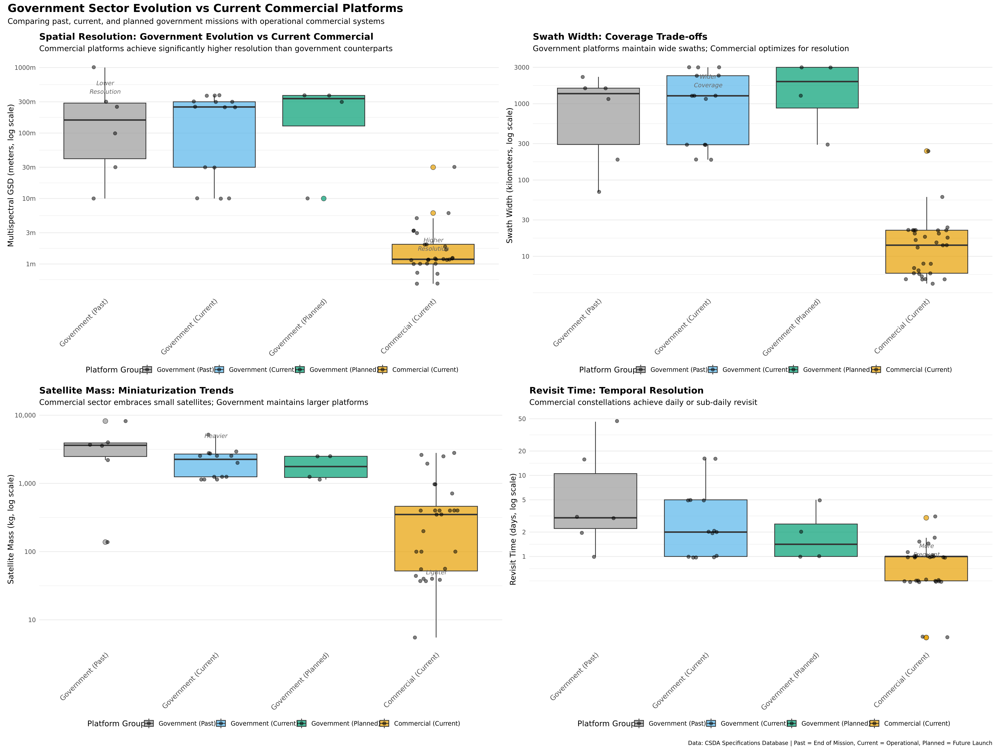

In [17]:
options(repr.plot.width = 20, repr.plot.height = 15, repr.plot.res = 300)

# MAIN COMBINED PLOT: 4-panel comparison
main_plot <- (p1 | p2) / (p3 | p4) +
  plot_annotation(
    title = "Government Sector Evolution vs Current Commercial Platforms",
    subtitle = "Comparing past, current, and planned government missions with operational commercial systems",
    caption = "Data: CSDA Specifications Database | Past = End of Mission, Current = Operational, Planned = Future Launch",
    theme = theme(
      plot.title = element_text(size = 16, face = "bold", hjust = 0),
      plot.subtitle = element_text(size = 11, hjust = 0),
      plot.caption = element_text(size = 8, hjust = 1)
    )
  ) &
  theme(legend.position = "bottom")

print(main_plot)
ggsave("government_evolution_vs_commercial.png", main_plot,
       width = 14, height = 12, dpi = 300, bg = "white")

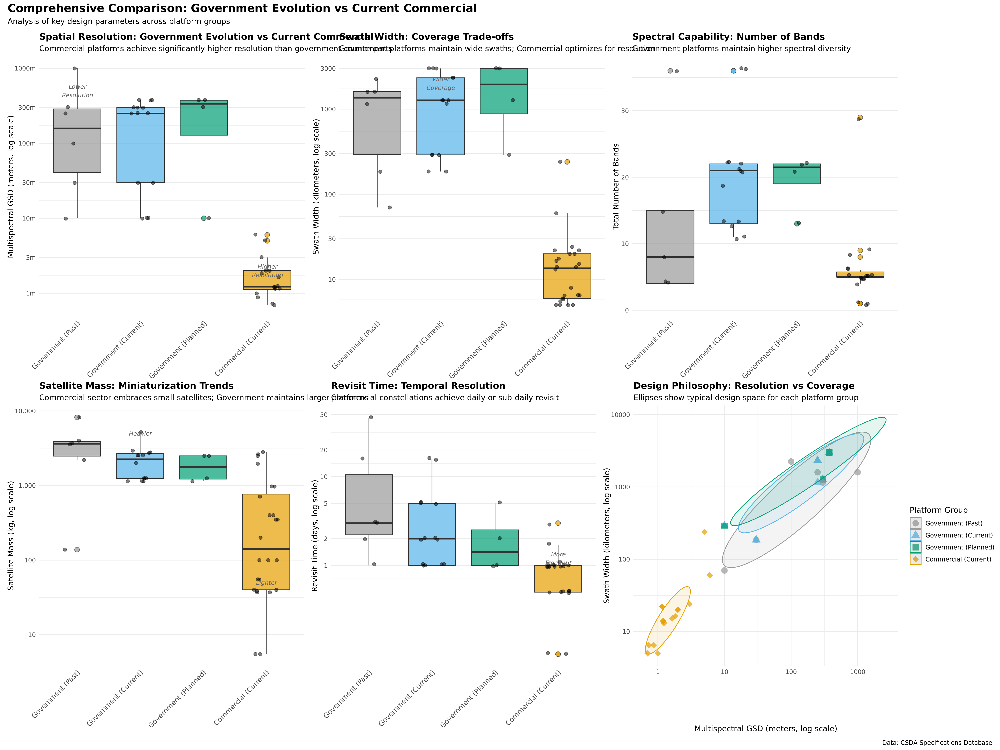

In [129]:
options(repr.plot.width = 20, repr.plot.height = 15, repr.plot.res = 300)

# COMPREHENSIVE 6-PANEL PLOT
comprehensive_plot <- (p1 | p2 | p5) / (p3 | p4 | p6) +
  plot_annotation(
    title = "Comprehensive Comparison: Government Evolution vs Current Commercial",
    subtitle = "Analysis of key design parameters across platform groups",
    caption = "Data: CSDA Specifications Database",
    theme = theme(
      plot.title = element_text(size = 16, face = "bold"),
      plot.subtitle = element_text(size = 11)
    )
  )

print(comprehensive_plot)
ggsave("comprehensive_era_comparison.png", comprehensive_plot,
       width = 18, height = 10, dpi = 300, bg = "white")

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`).”


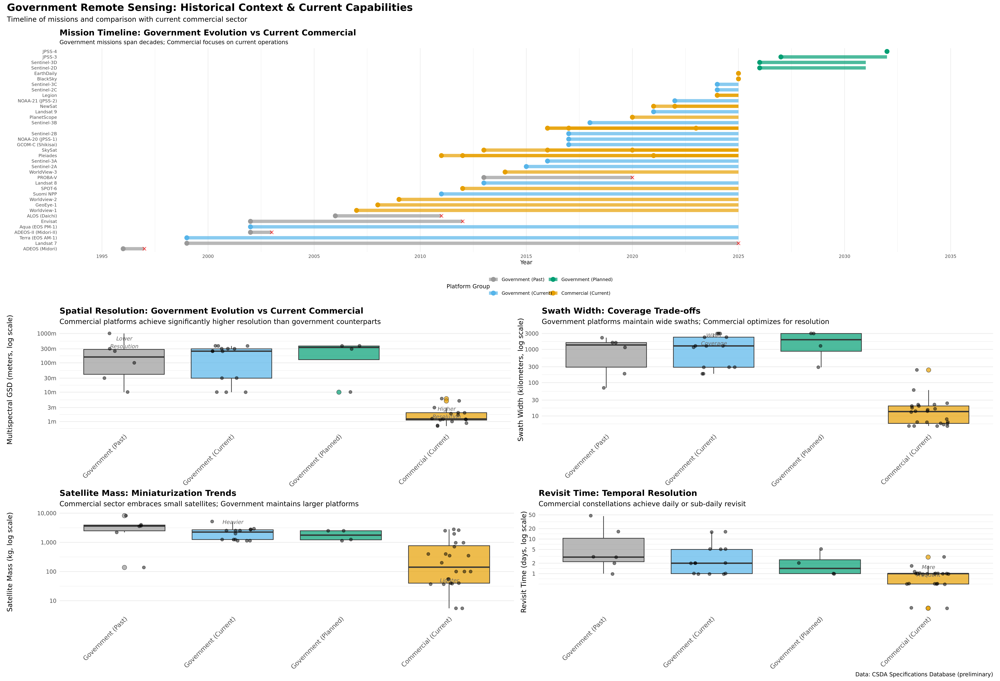

In [130]:
options(repr.plot.width = 22, repr.plot.height = 15, repr.plot.res = 300)


# TIMELINE WITH STATISTICS
timeline_stats_plot <- p7 / (p1 | p2 )/( p3 | p4) +
  plot_layout(heights = c(2, 1,1)) +
  plot_annotation(
    title = "Government Remote Sensing: Historical Context & Current Capabilities",
    subtitle = "Timeline of missions and comparison with current commercial sector",
    caption = "Data: CSDA Specifications Database (preliminary)",
    theme = theme(
      plot.title = element_text(size = 16, face = "bold"),
      plot.subtitle = element_text(size = 11)
    )
  )

print(timeline_stats_plot)
ggsave("timeline_with_statistics.png", timeline_stats_plot,
       width = 16, height = 14, dpi = 300, bg = "white")

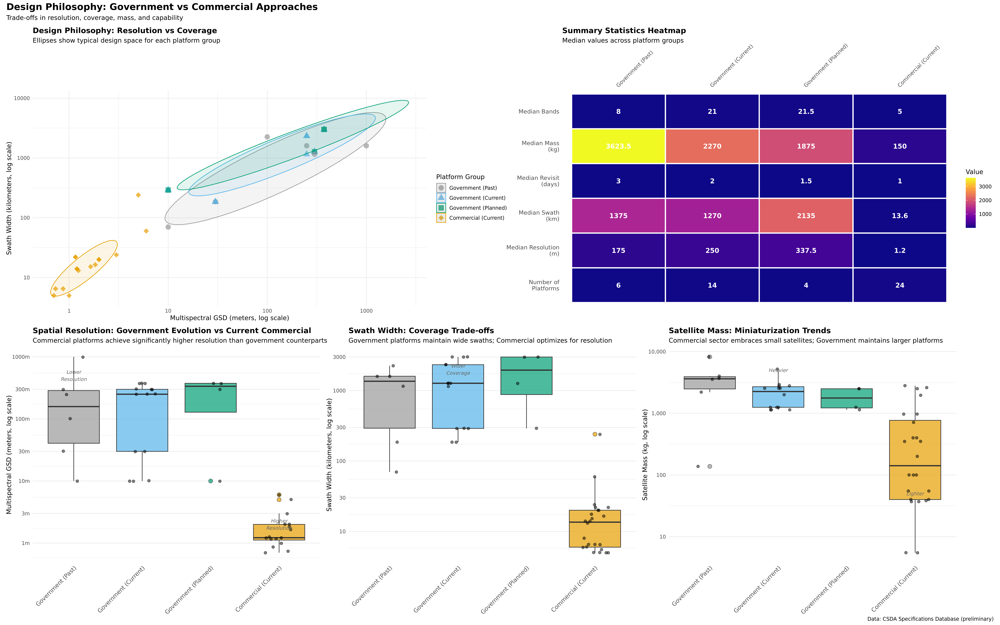

In [131]:
options(repr.plot.width = 24, repr.plot.height = 15, repr.plot.res = 300)

# DESIGN TRADE-OFF FOCUSED PLOT
tradeoff_plot <- (p6 | p8) / (p1 | p2 | p3) +
  plot_annotation(
    title = "Design Philosophy: Government vs Commercial Approaches",
    subtitle = "Trade-offs in resolution, coverage, mass, and capability",
    caption = "Data: CSDA Specifications Database (preliminary)",
    theme = theme(
      plot.title = element_text(size = 16, face = "bold"),
      plot.subtitle = element_text(size = 11)
    )
  )

print(tradeoff_plot)
ggsave("design_tradeoff_comparison.png", tradeoff_plot,
       width = 16, height = 10, dpi = 300, bg = "white")

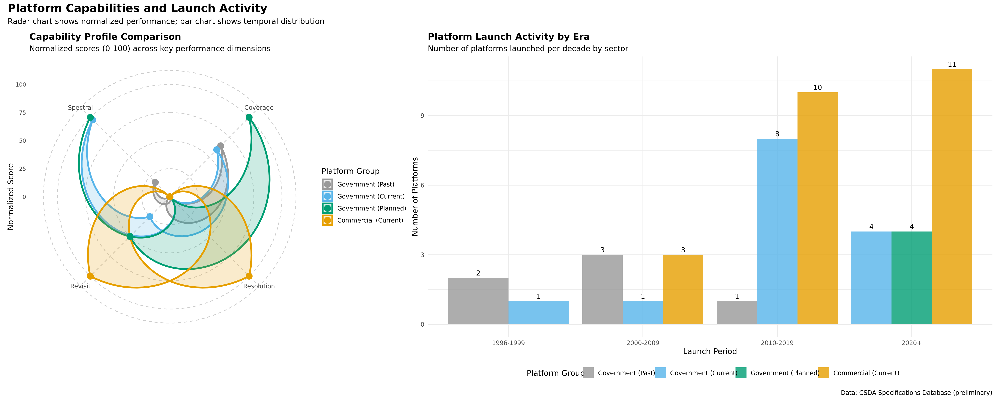

In [132]:
options(repr.plot.width = 20, repr.plot.height = 8, repr.plot.res = 300)


# SPIDER/RADAR CHART WITH BAR CHART
capability_plot <- (p9 | p10) +
  plot_annotation(
    title = "Platform Capabilities and Launch Activity",
    subtitle = "Radar chart shows normalized performance; bar chart shows temporal distribution",
    caption = "Data: CSDA Specifications Database (preliminary)",
    theme = theme(
      plot.title = element_text(size = 16, face = "bold"),
      plot.subtitle = element_text(size = 11)
    )
  )

print(capability_plot)
ggsave("capability_activity_comparison.png", capability_plot,
       width = 16, height = 8, dpi = 300, bg = "white")

In [133]:
# Print summary statistics
cat("\n=== SUMMARY STATISTICS ===\n\n")
summary_table <- df_era %>%
  group_by(Era_Group) %>%
  summarise(
    Count = n(),
    `Median Resolution (m)` = round(median(`MS GSD Nadir (m)`, na.rm = TRUE), 1),
    `Median Swath (km)` = round(median(`Swath Width (km)`, na.rm = TRUE), 0),
    `Median Revisit (days)` = round(median(`Revisit Time (days)`, na.rm = TRUE), 1),
    `Median Mass (kg)` = round(median(`Weight Range (kg)`, na.rm = TRUE), 0),
    `Median Bands` = round(median(`Total Bands`, na.rm = TRUE), 0),
    .groups = 'drop'
  )

print(summary_table)

# Export summary table
write_csv(summary_table, "platform_comparison_summary.csv")

cat("\n=== FILES GENERATED ===\n")
cat("1. government_evolution_vs_commercial.png - Main 4-panel comparison\n")
cat("2. comprehensive_era_comparison.png - 6-panel detailed comparison\n")
cat("3. timeline_with_statistics.png - Timeline with box plots\n")
cat("4. design_tradeoff_comparison.png - Design philosophy analysis\n")
cat("5. capability_activity_comparison.png - Radar chart with launch activity\n")
cat("6. platform_comparison_summary.csv - Summary statistics table\n")


=== SUMMARY STATISTICS ===

# A tibble: 4 × 7
  Era_Group            Count `Median Resolution (m)` `Median Swath (km)`
  <fct>                <int>                   <dbl>               <dbl>
1 Government (Past)        6                   175                  1375
2 Government (Current)    14                   250                  1270
3 Government (Planned)     4                   338.                 2135
4 Commercial (Current)    24                     1.2                  14
# ℹ 3 more variables: `Median Revisit (days)` <dbl>, `Median Mass (kg)` <dbl>,
#   `Median Bands` <dbl>

=== FILES GENERATED ===
1. government_evolution_vs_commercial.png - Main 4-panel comparison
2. comprehensive_era_comparison.png - 6-panel detailed comparison
3. timeline_with_statistics.png - Timeline with box plots
4. design_tradeoff_comparison.png - Design philosophy analysis
5. capability_activity_comparison.png - Radar chart with launch activity
6. platform_comparison_summary.csv - Summary statistics ta